In [2]:
%matplotlib inline
import numpy as np
import scipy
from scipy import misc
import imageio
import matplotlib.pyplot as plt
print(scipy.__version__)

1.2.0


In [3]:
from skimage import data
photo_data=imageio.imread('/home/anilla/DataScience/Data_Science_Practise/wifire/sd-3layers.jpg')
print(type(photo_data))
photo_data.shape

<class 'imageio.core.util.Image'>


(3725, 4797, 3)

Seeing what's in the image

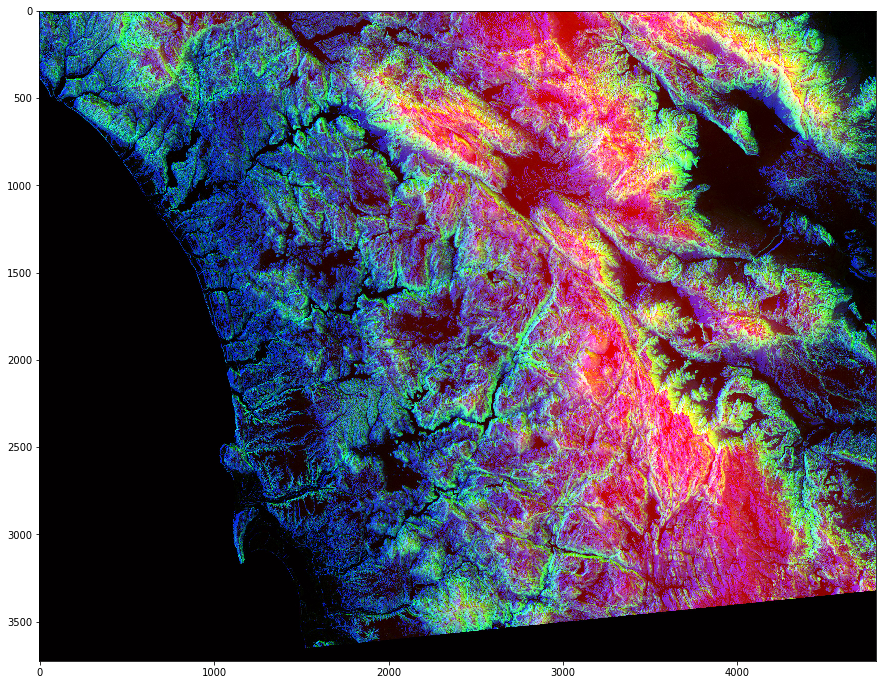

In [4]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [5]:
print(photo_data)

[[[  0  22  35]
  [  0  11  57]
  [ 19  32 128]
  ...
  [ 19  21  98]
  [  0   6  28]
  [  0  19   0]]

 [[ 30  64 109]
  [ 29  46 128]
  [ 25  33 157]
  ...
  [  1   5  50]
  [  0   5  34]
  [  0   4  28]]

 [[ 23  57 155]
  [ 16  35 174]
  [ 15  24 189]
  ...
  [  0   5   9]
  [  0   5  34]
  [  0   2  69]]

 ...

 [[  2   0   1]
  [  2   0   1]
  [  2   0   1]
  ...
  [  2   0   1]
  [  2   0   1]
  [  2   0   1]]

 [[  2   0   1]
  [  2   0   1]
  [  2   0   1]
  ...
  [  2   0   1]
  [  2   0   1]
  [  2   0   1]]

 [[  2   0   1]
  [  2   0   1]
  [  2   0   1]
  ...
  [  2   0   1]
  [  2   0   1]
  [  2   0   1]]]


# RGB
#### Red pixel indicates Altitude
#### Blue pixel indicates Aspect
#### Green pixel indicates Slope

In [6]:
photo_data.size

53606475

In [33]:
a=np.array([[2,3,4],[5,6,7]])
a.mean()
a.shape

(2, 3)

In [14]:
a.size

6

In [15]:
photo_data.min()

0

In [16]:
photo_data.max()

255

In [18]:
photo_data.mean()

75.8299354508947

In [19]:
photo_data[150,250]

Image([ 17,  35, 255], dtype=uint8)

In [20]:
photo_data[150,250,0]

17

### set a pixel to all zero

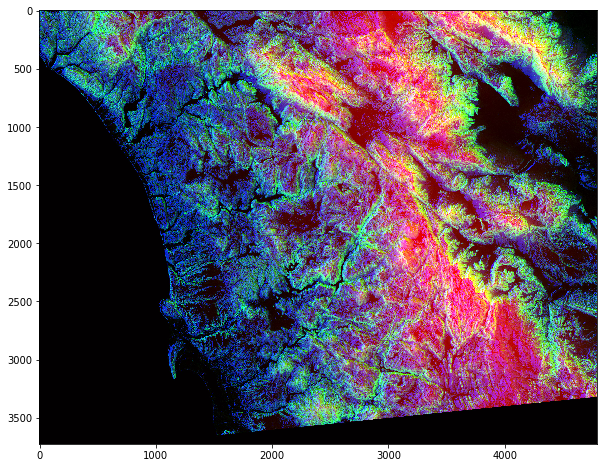

In [21]:
photo_data[150,250]=0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

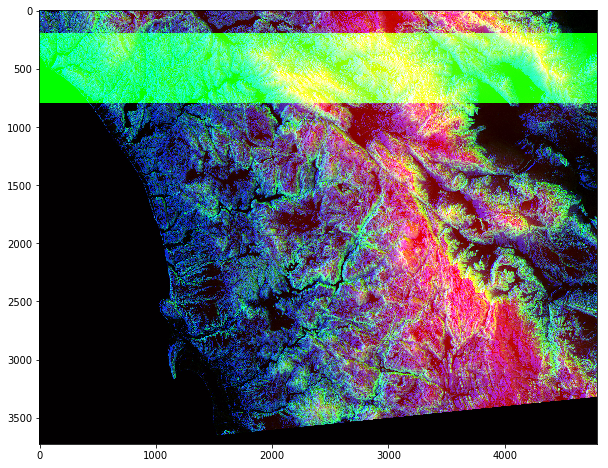

In [24]:
photo_data[200:800,:,1]=255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

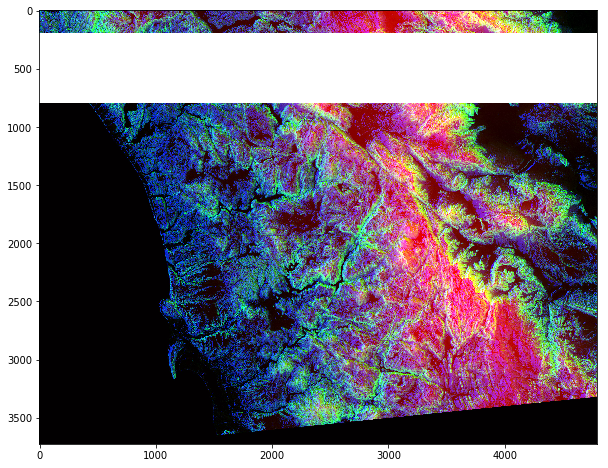

In [28]:
photo_data=imageio.imread('/home/anilla/DataScience/Data_Science_Practise/wifire/sd-3layers.jpg')
photo_data[200:800, :]=255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

## Pick all Pixels with Low Values

In [37]:
photo_data=imageio.imread('/home/anilla/DataScience/Data_Science_Practise/wifire/sd-3layers.jpg')
print(f"Shape of Photo data is: {photo_data.shape}")

Shape of Photo data is: (3725, 4797, 3)


In [36]:
low_value_filter=photo_data < 200
print(f'Shape of Low Value Filter:{low_value_filter.shape}')

Shape of Low Value Filter:(3725, 4797, 3)


### Filtering Out Low Values


#### whenever the low value filter is True, we set the value to 0

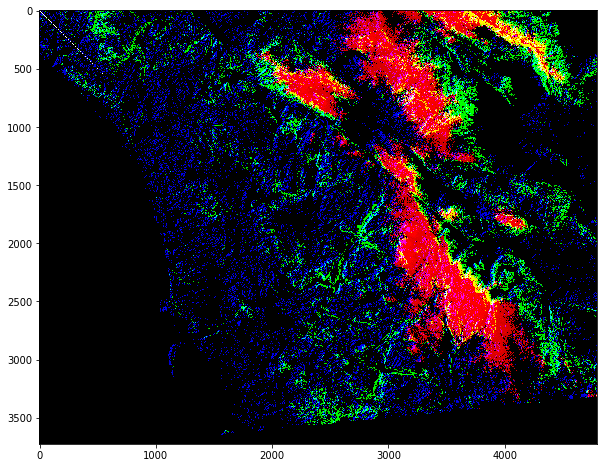

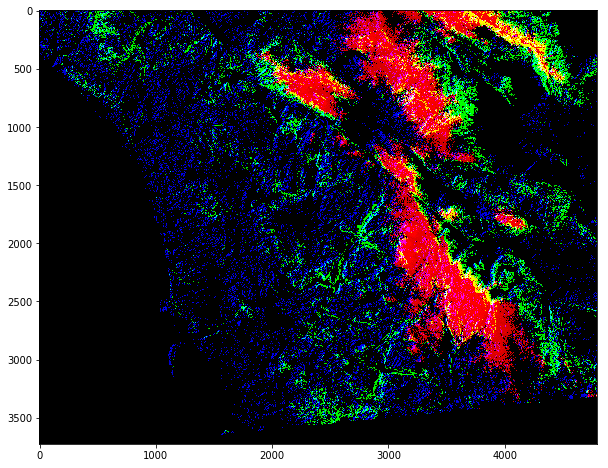

In [44]:
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
photo_data[low_value_filter]=0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

## more row and column operations


#### one can design complex patterns by making col a function of rows and vice versa.
#### Here we try a linear relationship between rows and columns


In [40]:
rows_range=np.arange(len(photo_data))
print(rows_range)

[   0    1    2 ... 3722 3723 3724]


In [41]:
cols_range=rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [66]:
photo_data[rows_range,cols_range]=255

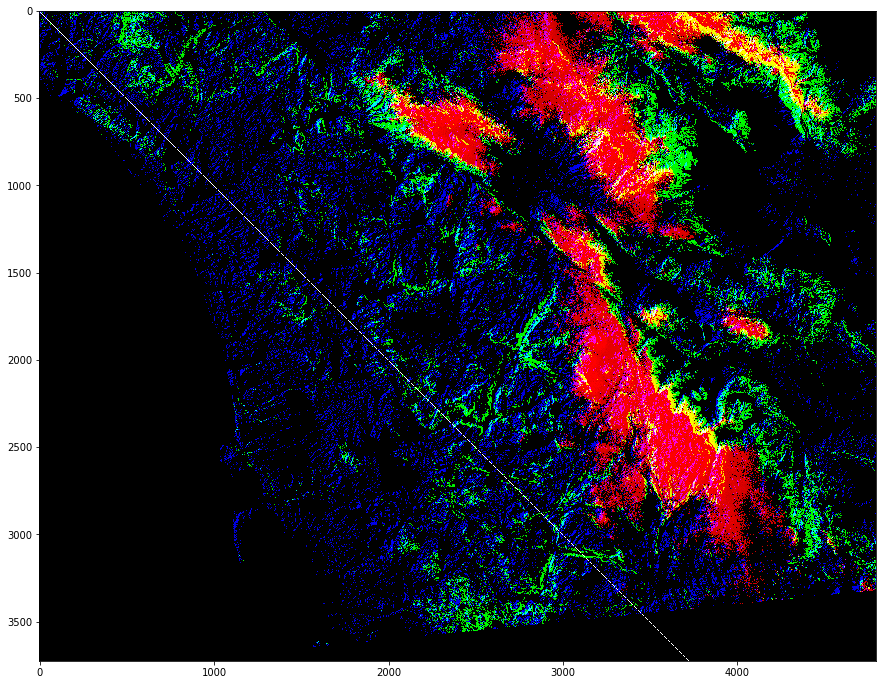

In [43]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

   ### Masking Images

In [48]:
rows,columns,layers=photo_data.shape

In [49]:
print(rows)

3725


In [50]:
X,Y=np.ogrid[:rows,:columns,]

In [51]:
print('X=',X.shape,'and Y = ',Y.shape)

X= (3725, 1) and Y =  (1, 4797)


In [52]:
center_row,center_col=rows/2,columns/2

In [53]:
center_row

1862.5

In [54]:
dist_from_center=(X-center_row)**2 + (Y-center_col)**2

In [55]:
dist_from_center


array([[9221708.5, 9216912.5, 9212118.5, ..., 9207326.5, 9212118.5,
        9216912.5],
       [9217984.5, 9213188.5, 9208394.5, ..., 9203602.5, 9208394.5,
        9213188.5],
       [9214262.5, 9209466.5, 9204672.5, ..., 9199880.5, 9204672.5,
        9209466.5],
       ...,
       [9210542.5, 9205746.5, 9200952.5, ..., 9196160.5, 9200952.5,
        9205746.5],
       [9214262.5, 9209466.5, 9204672.5, ..., 9199880.5, 9204672.5,
        9209466.5],
       [9217984.5, 9213188.5, 9208394.5, ..., 9203602.5, 9208394.5,
        9213188.5]])

In [56]:
photo_data

Image([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [57]:
radius=(rows/2)**2

In [58]:
radius

3468906.25

In [59]:
circular_mask=(dist_from_center > radius)

In [60]:
circular_mask

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [61]:
print(circular_mask[1500:2000,2000:2200])

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


In [62]:
photo_data=imageio.imread('/home/anilla/DataScience/Data_Science_Practise/wifire/sd-3layers.jpg')


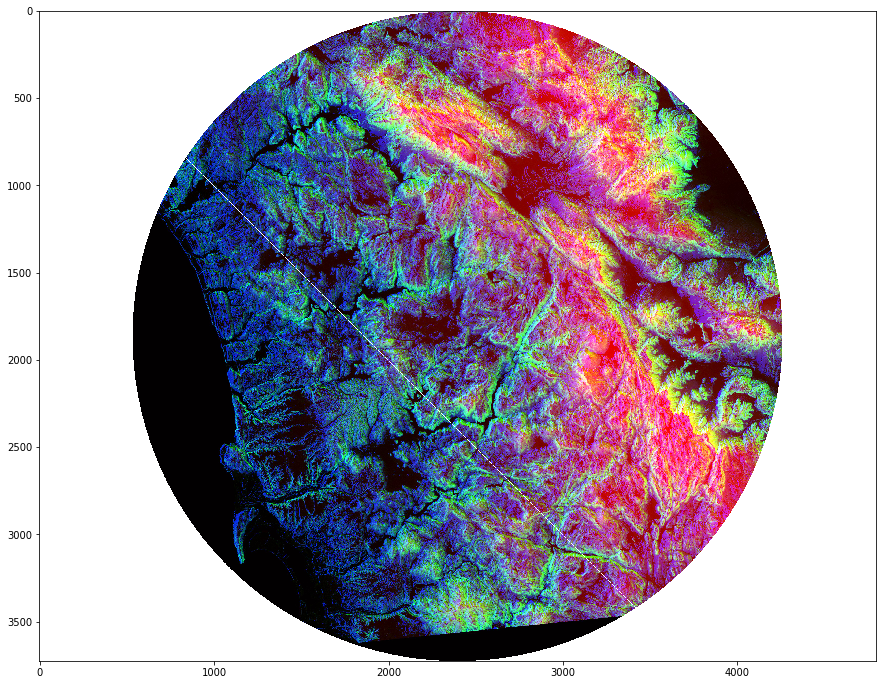

In [70]:
photo_data[circular_mask]= 255
plt.figure(figsize=(15,15))
plt.imshow(photo_data)


## Further Masking

In [71]:
X,Y=np.ogrid[:rows,:columns]
half_upper=X < center_row
half_upper_mask=np.logical_and(half_upper,circular_mask)

In [76]:
photo_data=imageio.imread('/home/anilla/DataScience/Data_Science_Practise/wifire/sd-3layers.jpg')


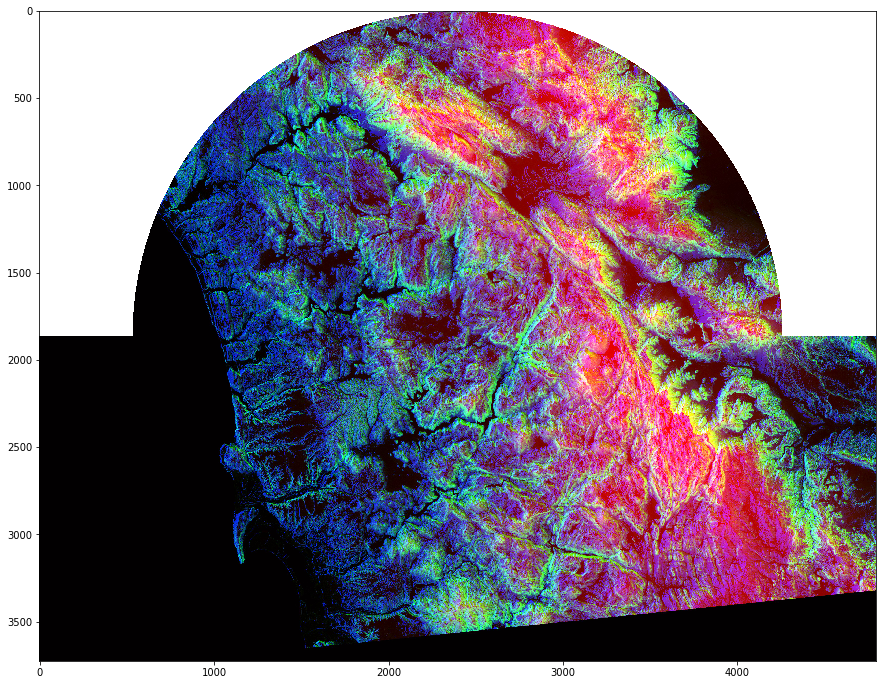

In [77]:
photo_data[half_upper_mask]=255
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Further Processing of our Satellite Imagery

### Processing of Red Pixels

##### Red pixels tells about the height .Lets us try and hightlight all high  altthude areas by detecting high intensity RED PIxels and muting down other areas

In [78]:
photo_data=imageio.imread('/home/anilla/DataScience/Data_Science_Practise/wifire/sd-3layers.jpg')


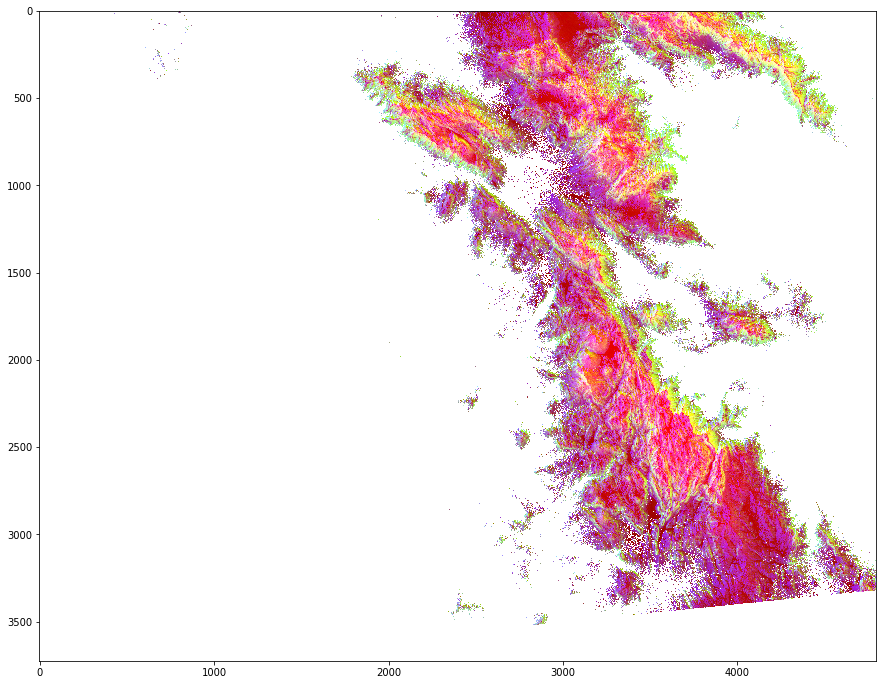

In [79]:
red_mask=photo_data[:,:,0]<150
photo_data[red_mask]=255
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Green Pixels

In [4]:
photo_data=imageio.imread('/home/anilla/DataScience/Data_Science_Practise/wifire/sd-3layers.jpg')


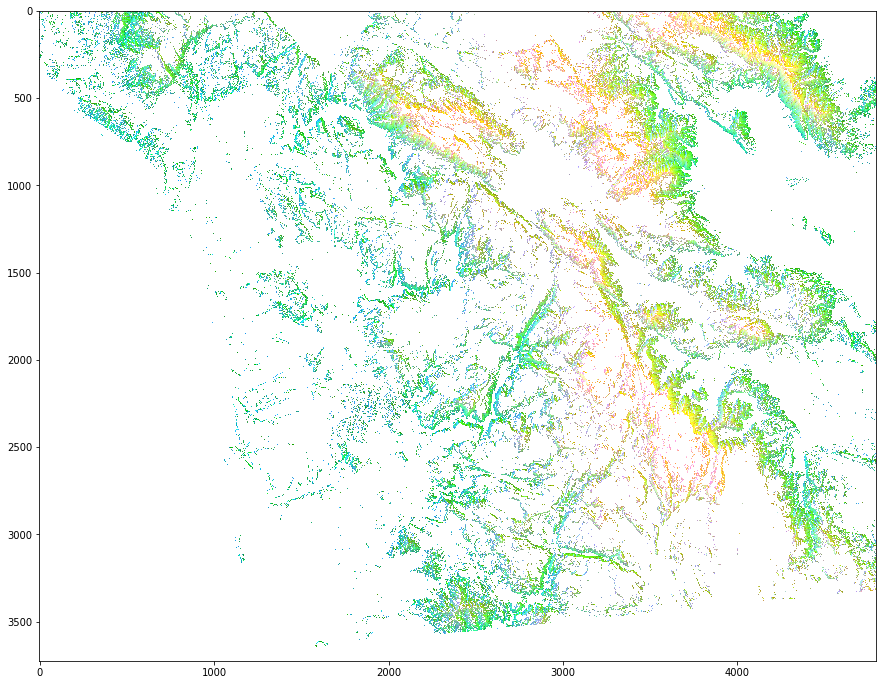

In [5]:
green_mask=photo_data[:,:,1] < 150
photo_data[green_mask] = 255
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

### Composite mask that takes threshholds on all three layers : RED,GREEN,BLUE

In [6]:
photo_data=imageio.imread('/home/anilla/DataScience/Data_Science_Practise/wifire/sd-3layers.jpg')


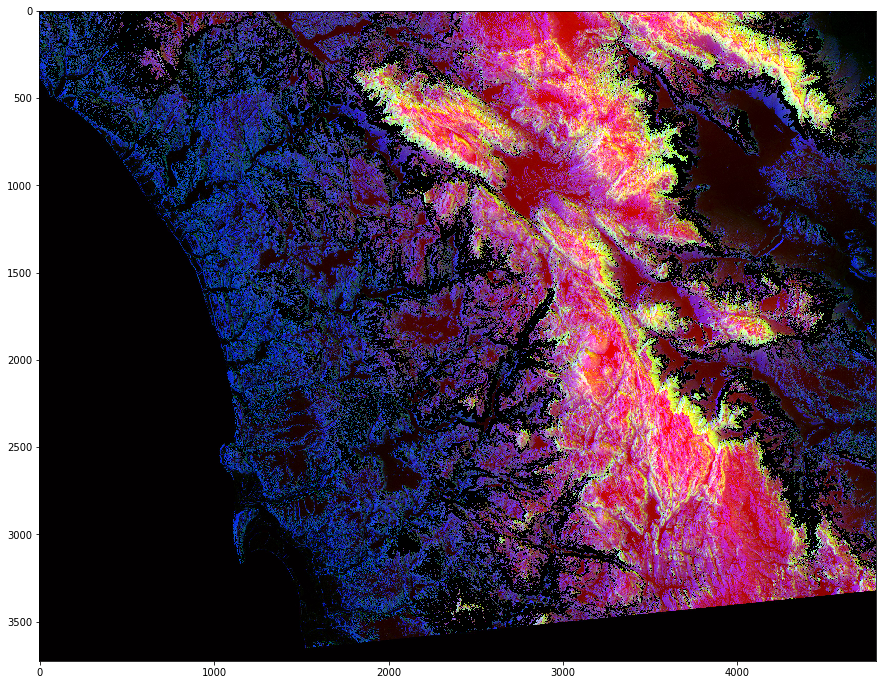

In [8]:
red_mask=photo_data[:,:,0]<150
green_mask=photo_data[:,:,1]>100
blue_mask=photo_data[:,:,2]<100
final_mask=np.logical_and(red_mask,green_mask,blue_mask)
photo_data[final_mask]=255
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [9]:
_